# Machine Learning Project Checklist

1. Frame the problem and look at the big picture.

2. Get the data.

3. **Explore the data to gain insights.**

4. Explore many different models and short-list the best ones.

5. Fine-tune your models and combine them into a great solution.

6. Present your solution.

## 3. Explore the data to gain insigths
- Study each attribute and its characteristics
- Visualize the data
- Study the correlations between attributes

In [1]:
import os

In [2]:
REPO_DIR = os.path.join(os.environ['USERPROFILE'], 'repos')
PROJ_DIR = os.path.join(REPO_DIR, 'real_estate_machine_learning')
os.chdir(PROJ_DIR)

In [78]:
DATA_DIR = './data'
RPT_DIR = './reports'
RAW_DIR = os.path.join(DATA_DIR, 'raw')
INT_DIR = os.path.join(DATA_DIR, 'interim')
IMG_DIR = os.path.join(DATA_DIR, 'img')

In [76]:
import pandas as pd, numpy as np
import re
from collections import Counter
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import normaltest
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.basemap import Basemap

In [5]:
import src.processing as proc
from src.processing import extract_num
import src.visualization as viz
from src.utils import *
%matplotlib inline

## Loading training dataset
In the *Processing* step I have converted all the features into proper datatypes and created new columns, where the initial feature couldn't be analyzed with the original value representations.  
e.g.: Rooms: 2 full rooms and 1 half room.

In [6]:
train_sale = pd.read_csv(os.path.join(INT_DIR, 'training_sale_20181101.csv'), encoding='utf8', dtype={'city_district': 'object'}).drop(['property_id', 'id'], axis = 1)
train_rent = pd.read_csv(os.path.join(INT_DIR, 'training_rent_20181101.csv'), encoding='utf8', dtype={'city_district': 'object'}).drop(['property_id', 'id'], axis = 1)

In [7]:
train_sale.head(3)

,address,accessibility,ceiling_height,buses,buses_count,furnished,desc,city_district,smoking,floors,...,building_floors,timestamp,elevation,room_lt_12_sqm,room_ge_12_sqm,room_total,parking_lot_in_huf,parking_lot_in_eur,parking_lot_in_huf_monthly,parking_lot_in_eur_monthly
0,Budai Bolero II,igen,NaN,103|133E|33,3.0,NaN,| Exkluzív otthon az Ön igényeire szabva! A Bu...,11,NaN,10,...,10,2018-11-03 08:23:13.955910,102,1.0,3.0,4.0,3200000.0,NaN,NaN,NaN
1,Csata utca 30.,NaN,3 m-nél alacsonyabb,14|32|105,3.0,NaN,| XIII kerület közkedvelt részén az Árpád-hí...,13,NaN,földszint,...,5,2018-11-03 08:23:16.124314,106,0.0,3.0,3.0,2890000.0,NaN,NaN,NaN
2,Csata utca 30.,NaN,3 m-nél alacsonyabb,14|32|105,3.0,NaN,| XIII kerület közkedvelt részén az Árpád-hí...,13,NaN,2,...,5,2018-11-03 08:23:18.277117,106,0.0,3.0,3.0,2890000.0,NaN,NaN,NaN


## Data exploration

In the scraped dataset, if the user didn't fill in the given attribute of listing property e.g. *condition of the real estate, balcony area size* etc. then it will appear as missing datapoint. On other hand if a feature is not applicable for the given listing type e.g. in case of properties for sale *minimum tenancy, smoking allowed, pets allowed* it will appear as missing value as well.

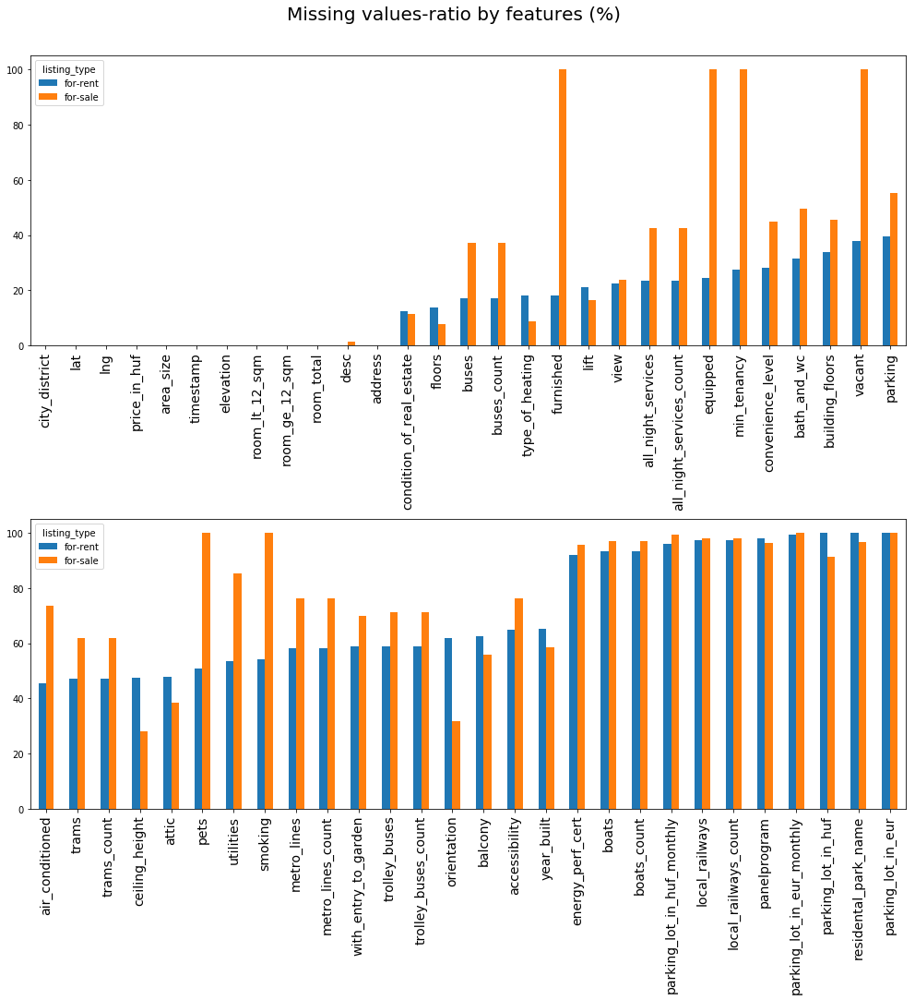

In [8]:
viz.plot_na_ratio(pd.concat([train_sale, train_rent], axis=0), grouping='listing_type', dest_dir=RPT_DIR)
plt.show()

### Missing values
Handling the missing values:
1. No action, using only fully represented variables
2. Impute with mean, median, mode
3. Model the feature leveraging of other variables
4. Using *Natural Language Processing* on property description and combine with the 3rd option  

As a first phase I will use only fully represented features, afterwards I will impute the missing values with predictions of the different models based on NLP, other well-correlated features or the blend of the two.

Fully represented features:
- Price in HUF
- Latitude
- Longitude
- Elevation
- Area size
- Total number of rooms, sum of *rooms equal or greater than 12 m$^2$* and *rooms less than 12 m$^2$*
- District
- Address

The first 6 features measured on ratio scale, others on nominal scale. In machine learning features measured on interval/ratio are preferred.  
**As a first step, my goal is to create an intuitive model, from these features. Desirably with only two explanatory variable to be able to visualize in 3D without reducing dimensions.**

In [9]:
fully_repr_num=['price_in_huf', 'lat', 'lng', 'elevation', 'area_size', 'room_total']

### Distribution of the features

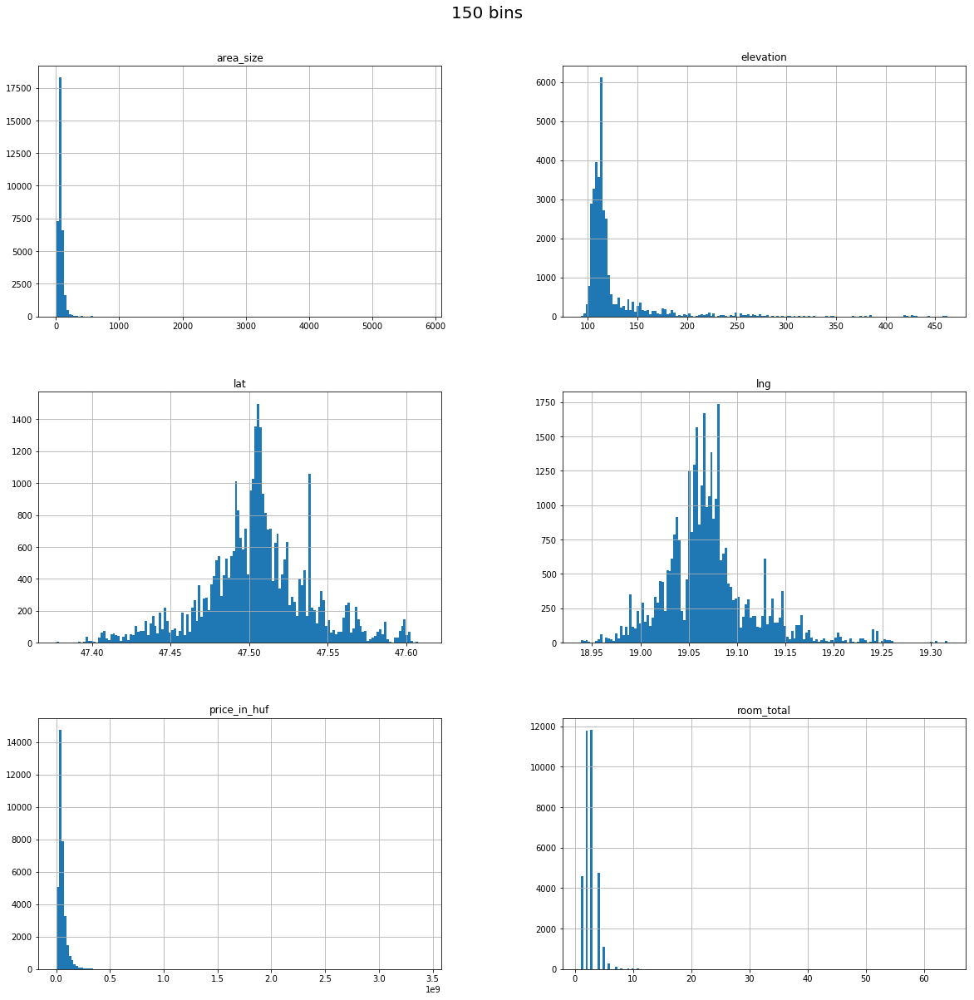

In [10]:
bins=150
train_sale[fully_repr_num].hist(bins=bins, figsize=(20,20))
plt.suptitle('{} bins'.format(bins), fontsize=20, weight=15, y=0.93)
plt.savefig('{0}/{1}_bins_{2}{3}'.format(RPT_DIR, 'histograms', bins, '.png'))

In [11]:
train_sale[fully_repr_num].describe()

,price_in_huf,lat,lng,elevation,area_size,room_total
count,3.460500e+04,34605.000000,34605.000000,34605.000000,34605.000000,34605.000000
mean,5.393875e+07,47.504952,19.070466,124.059529,72.705274,2.677908
std,4.727107e+07,0.034070,0.046005,36.189492,54.358514,1.448156
min,2.000000e+06,47.377407,18.938150,93.000000,8.000000,1.000000
25%,2.890000e+07,47.488250,19.043684,108.000000,49.000000,2.000000
50%,4.280000e+07,47.504910,19.066221,113.000000,64.000000,3.000000
75%,6.490000e+07,47.522550,19.085848,120.000000,87.000000,3.000000
max,3.410000e+09,47.610500,19.317210,462.000000,5800.000000,64.000000


Latitude and Longitude have a distribution similar to Gaussian bell curve, which is really useful property.  
Price in huf, area size and total number of rooms have similar distribution to Log-normal, although they are inflated with outliers, e.g. minimum size of property is 8 m$^2$ and maximum size of property is 5800 m$^2$.  
These outliers can be an user input mistake or if even they are valid inputs they are not representing well an average real estate in Budapest, therefore the data needs to be normalized by removing outliers.

### Relationship between variables
- Linear relationship (correlation matrices)
- Look for non-linear relationship (scatter-plot)

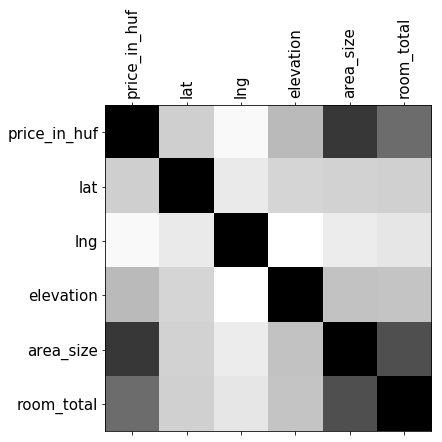

In [12]:
fig=plt.figure(figsize=(6,6))
ax=fig.gca()
ax.matshow(train_sale[fully_repr_num].corr(), cmap='Greys')
ax.xaxis.set_ticklabels(ticklabels=['']+train_sale[fully_repr_num].corr().columns.tolist(), rotation=90, fontsize=15)
ax.yaxis.set_ticklabels(ticklabels=['']+train_sale[fully_repr_num].corr().columns.tolist(), fontsize=15)
plt.show()

Some obvious relationships can be found, such as area size is well-correlated with the price and with total number of rooms.

In [13]:
corr=train_sale[fully_repr_num].corr()
corr.style.background_gradient()

,price_in_huf,lat,lng,elevation,area_size,room_total
price_in_huf,1,0.0489879,-0.283739,0.175625,0.763196,0.533076
lat,0.0489879,1,-0.129625,0.0164418,0.0339724,0.0412864
lng,-0.283739,-0.129625,1,-0.34291,-0.145639,-0.103804
elevation,0.175625,0.0164418,-0.34291,1,0.125083,0.114673
area_size,0.763196,0.0339724,-0.145639,0.125083,1,0.672143
room_total,0.533076,0.0412864,-0.103804,0.114673,0.672143,1


All in all it is redundant to include both area size and total number of rooms into the model as explanatory varibles, since area size is better correlated with the price and more continous than number of rooms. Other than that there are no significant linear relationship between the features above.

In [14]:
fully_repr_num.pop(fully_repr_num.index('room_total'))

'room_total'

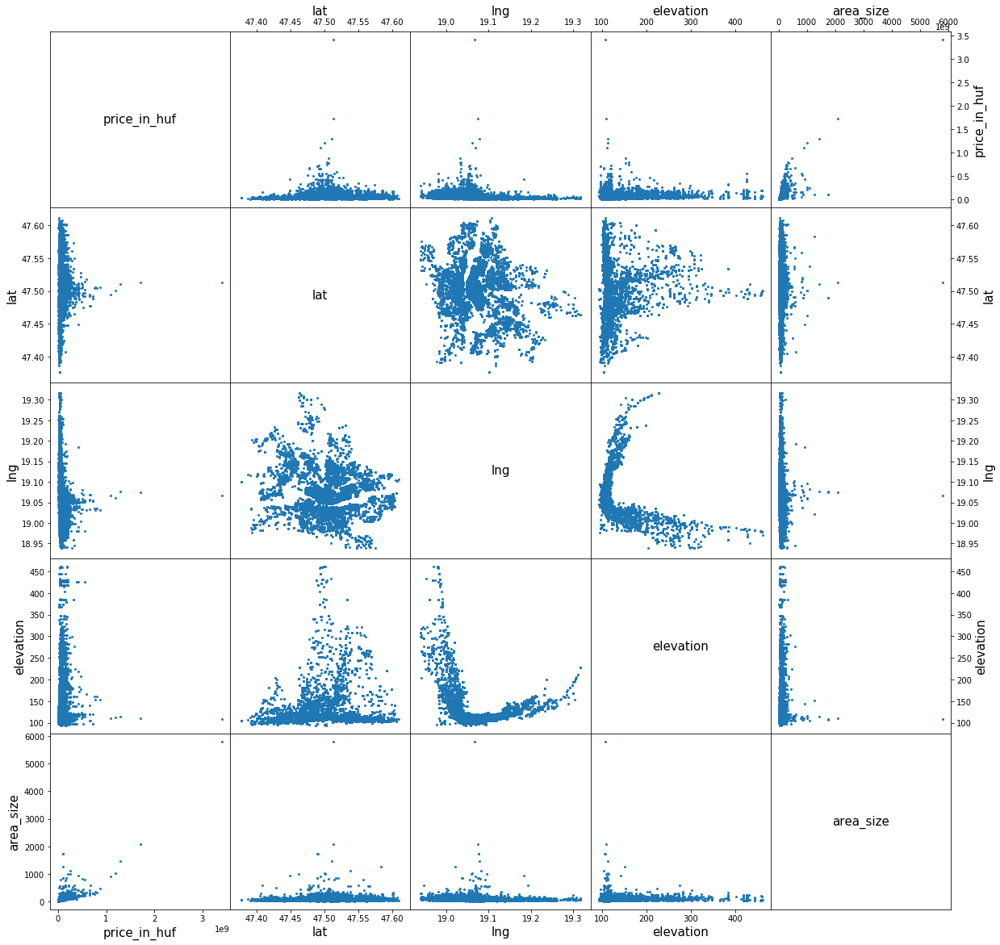

In [15]:
viz.plot_scatter_matrix(train_sale[fully_repr_num])
plt.show()

### Outlier detection
The method I will use is z-score or standardization, which is a simple approach to filter out the outliers.
- Standardization:
    - Subtracting mean (centered)
    - Dividing by standard deviation (scaled)  
    
However this methow works well only with quasi normally distributed features.

### Data transformation
- Log-Normal Distribution

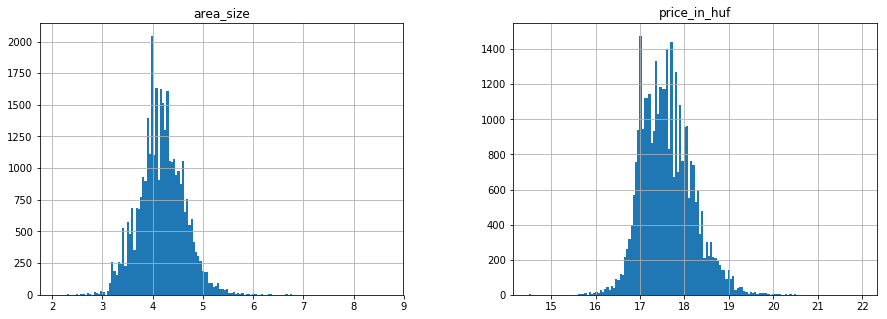

In [16]:
train_sale[['price_in_huf', 'area_size']].apply(np.log).hist(bins=bins, figsize=(15,5))
plt.show()

### Adding transformed features

In [17]:
train_sale.loc[:,'log_price_in_huf']=train_sale.price_in_huf.apply(np.log)
train_sale.loc[:,'log_area_size']=train_sale.area_size.apply(np.log)

In [18]:
quasi_normal_dist = ['lat', 'lng', 'log_price_in_huf', 'log_area_size']

In [19]:
scaler=StandardScaler()

In [20]:
st_train_sale_values=scaler.fit_transform(train_sale[quasi_normal_dist])

In [21]:
st_train_sale=pd.DataFrame(st_train_sale_values, columns=quasi_normal_dist)

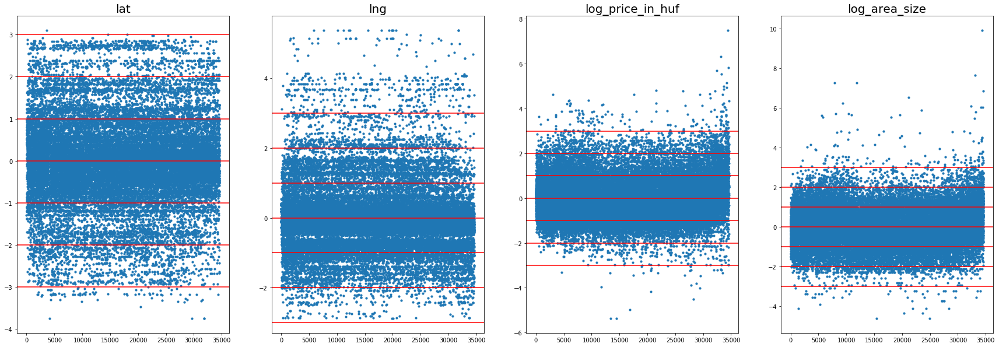

In [22]:
viz.plot_outliers(st_train_sale, n_std=3)
plt.show()

Number of sigmas (standard deviations) from the mean should be decided:

### Set sigma

In [23]:
ratios = proc.calc_outlier_ratio(st_train_sale, columns = ['lat', 'lng', 'log_price_in_huf', 'log_area_size'])

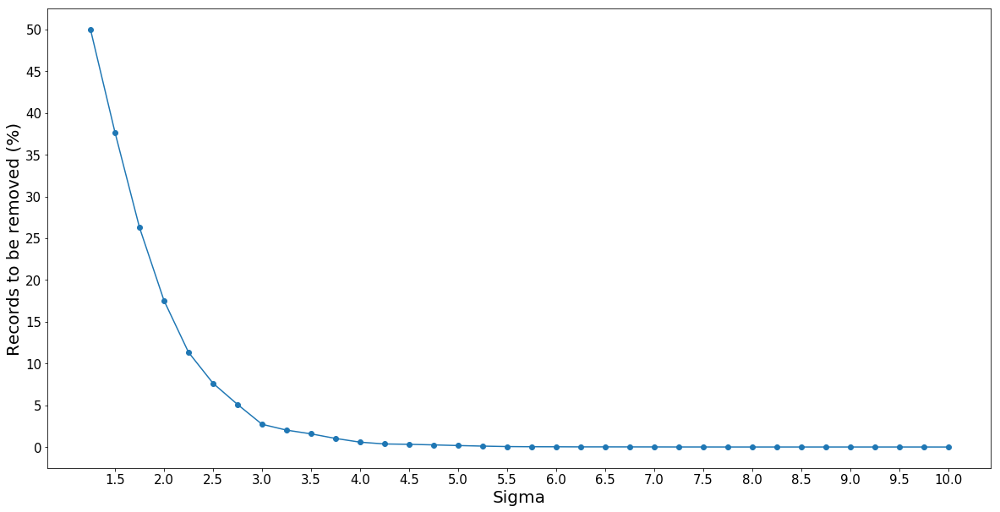

In [24]:
fig=plt.figure(figsize=(20,10))
plt.plot(ratios[:,0], ratios[:,1], marker='o')
plt.xticks(np.arange(10, 1, -0.5), fontsize=15)
plt.yticks(np.arange(50, -1, -5), fontsize=15)
plt.xlabel('Sigma', fontsize=20)
plt.ylabel('Records to be removed (%)', fontsize=20)
plt.show()

### Sigma input

In [25]:
sigma=2.5

In [26]:
outlier_mask = proc.create_outlier_mask(st_train_sale, columns = ['lat', 'lng', 'log_price_in_huf', 'log_area_size'], sigma_threshold = 2.5)

In [27]:
print('Removed records: {0:.3}%'.format(ratios[ratios[:,0] == 2.5, 1][0]))

Removed records: 7.64%


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


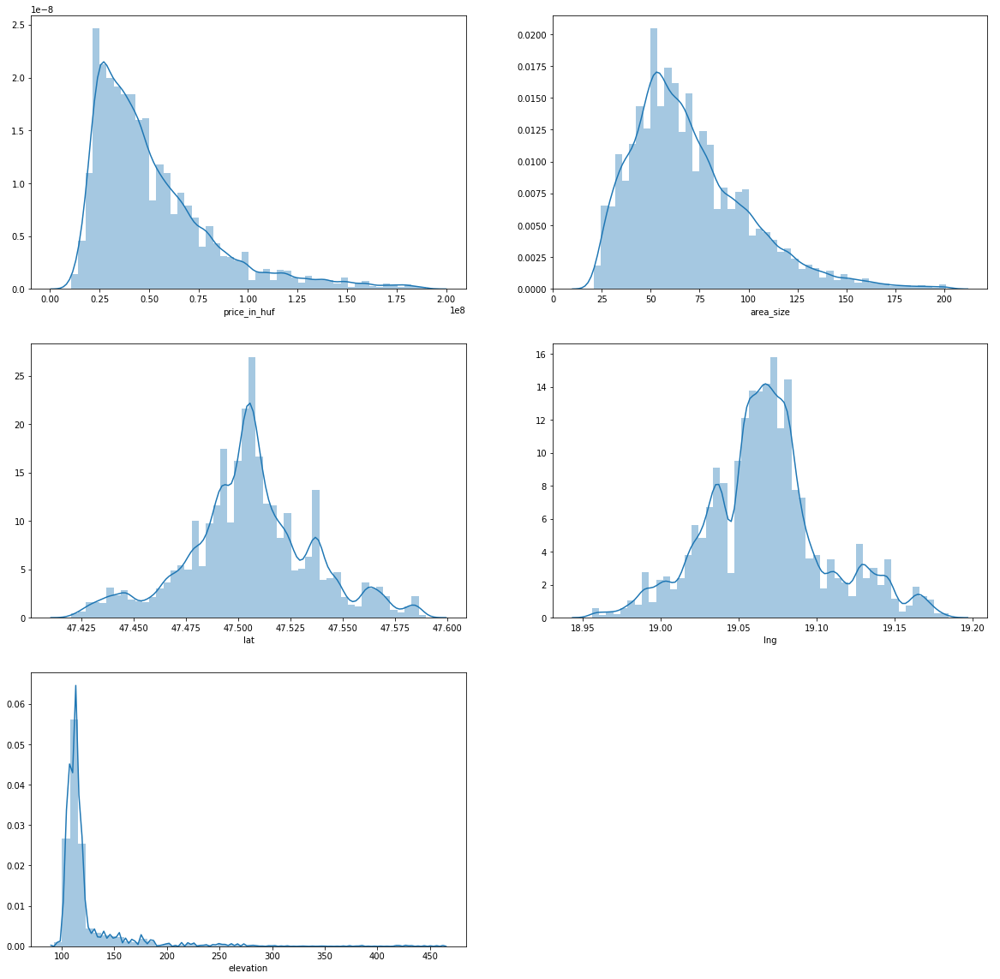

In [28]:
fig, axs = plt.subplots(3, 2)
fig.set_size_inches(20, 20)
sns.distplot(a=train_sale.loc[outlier_mask, 'price_in_huf'], ax = axs[0,0])
sns.distplot(a=train_sale.loc[outlier_mask, 'area_size'], ax = axs[0,1])
sns.distplot(a=train_sale.loc[outlier_mask, 'lat'], ax = axs[1,0])
sns.distplot(a=train_sale.loc[outlier_mask, 'lng'], ax = axs[1,1])
sns.distplot(a=train_sale.loc[outlier_mask, 'elevation'], ax = axs[2,0])
axs[2,1].axis('off')
plt.show()

After removing outliers, estimated distribution of the features look better, although histogram of *Latitude* and *Longitude* have some strange spikes, which is worth investigating.

### Longitude, Latitude

Calculation of the right picture ratio to plot the map of Budapest, capital city of Hungary.

In [29]:
min_gps=train_sale.loc[outlier_mask, ['lng', 'lat']].min()
max_gps=train_sale.loc[outlier_mask, ['lng', 'lat']].max()
pic_ratio=(max_gps['lat']-min_gps['lat'])/(max_gps['lng']-min_gps['lng'])
print(pic_ratio)

0.7405126861435021


In [30]:
opt_fig_size=viz.calc_fig_size(pic_ratio, 2.5)

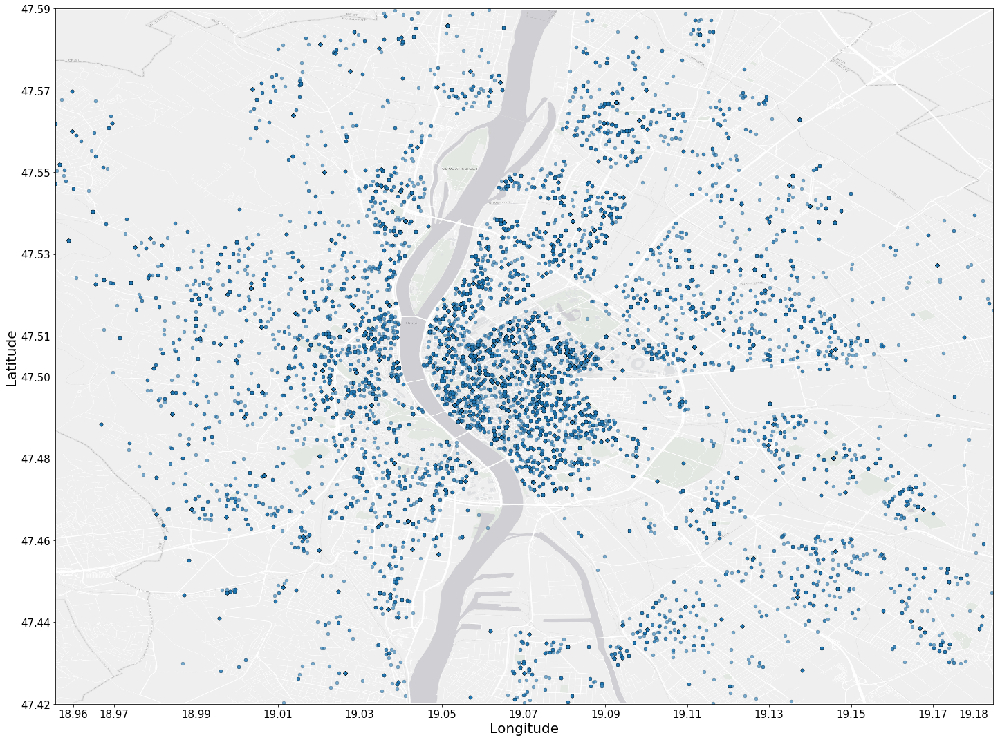

In [31]:
viz.plot_scatter_map(x=train_sale.loc[outlier_mask, 'lng'], y=train_sale.loc[outlier_mask, 'lat'], xlabel='Longitude', ylabel='Latitude', figsize=opt_fig_size, alpha = 0.6, dpi=160)
plt.show()

Decreasing the alpha to see the density of properties for sale in the map:

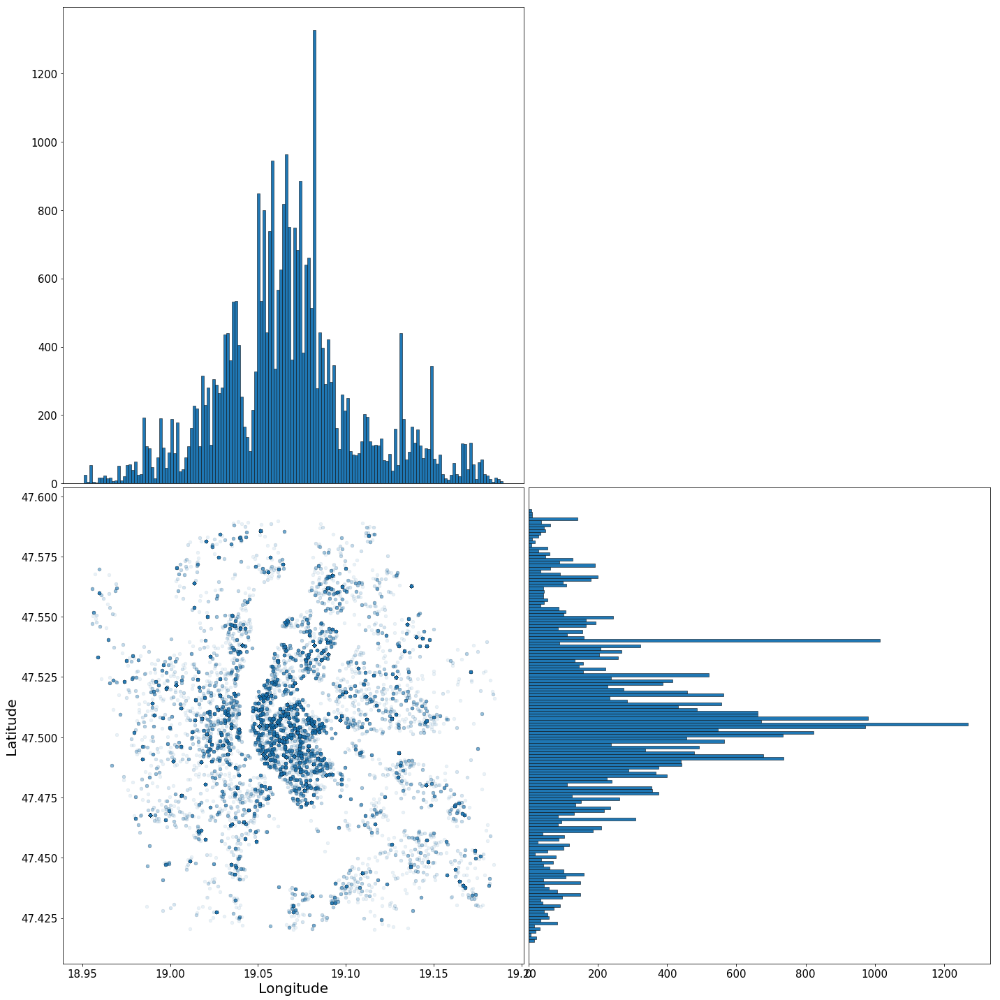

In [32]:
viz.plot_sca_hist(train_sale.loc[outlier_mask, ['lng', 'lat']], 'lng', 'lat', bins, 'Longitude', 'Latitude', alpha=0.1)
plt.show()

Check the data distributed by districts:

In [73]:
rnd_colors = load_pkl(os.path.join(RAW_DIR, 'colors_23_2'))

In [74]:
if not isinstance(locals().get('rnd_colors', None), np.ndarray):
    rnd_colors=np.random.choice(list(mpl.cm.colors.cnames.keys()), size=23, replace=False)

In [96]:
im_districts = mpimg.imread(os.path.join(EXT_DIR, 'districts.gif'))

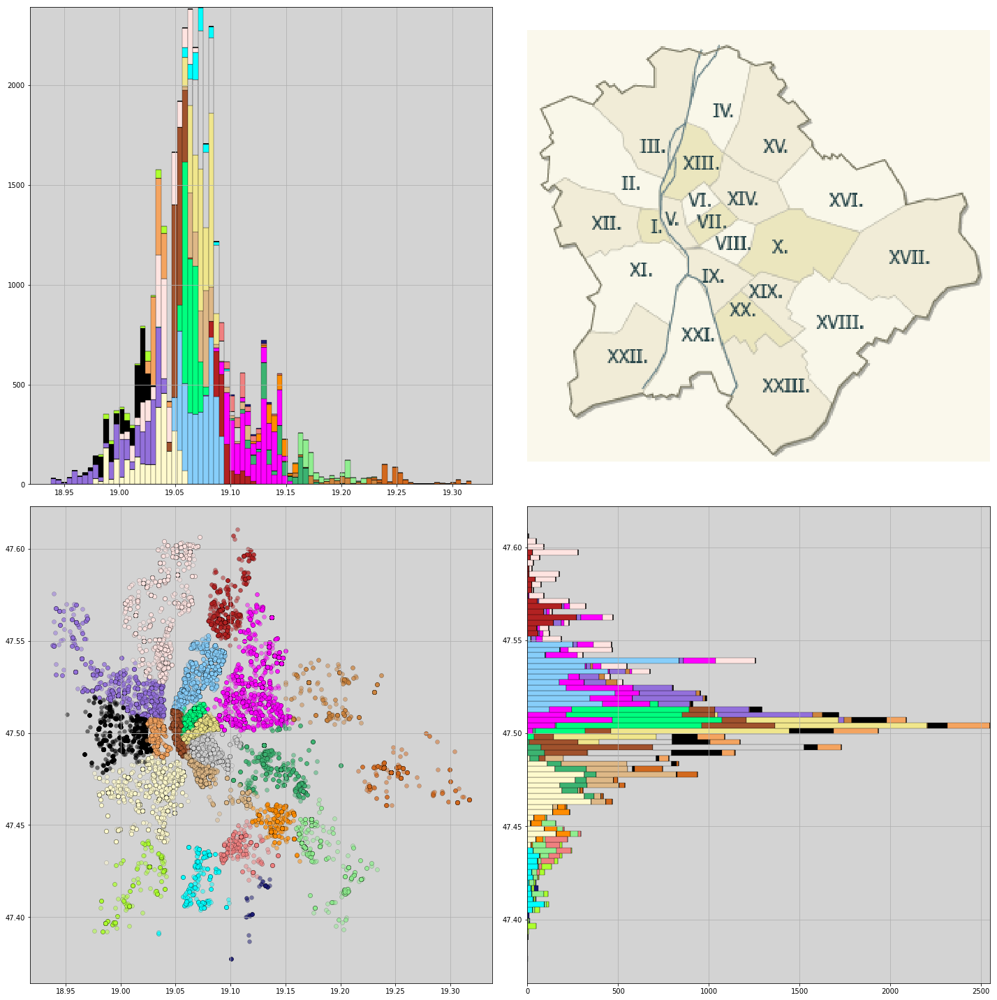

In [97]:
fig, axs = viz.plot_sca_stackedhist(train_sale, 'lng', 'lat', 'city_district', rnd_colors)
axs[0,1].imshow(im_districts)
plt.show()

In [107]:
gps_count = train_sale[['lat', 'lng', 'address']].groupby(['lat', 'lng']).count().reset_index().rename(columns = {'address': 'gps_count'})

In [113]:
train_sale = train_sale.merge(how='left', right=gps_count, on=['lat', 'lng'])

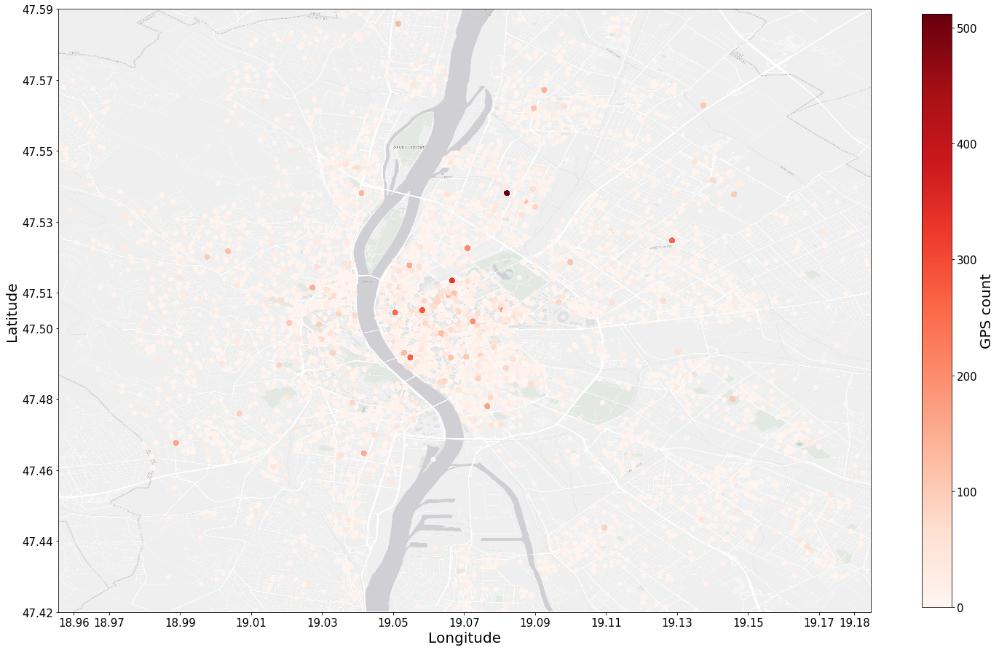

In [120]:
viz.plot_scatter_map(x=train_sale.loc[outlier_mask, 'lng'],
                 y=train_sale.loc[outlier_mask, 'lat'],
                 c=train_sale.loc[outlier_mask, 'gps_count'],
                 colormap='Reds', c_bar_shrink=0.81,
                 xlabel='Longitude', ylabel='Latitude', clabel='GPS count',
                 linewidth=0, s=50, alpha=1,
                 figsize=opt_fig_size, dpi=160)
plt.show()

The darker the dot in the map the more properties are listed for sale on the exact spot. It indicates either people want to sell off their apartment under the same address or there are some errors occured during data gathering.

Top 10 number of addresses pointing to the same GPS coordinates:

In [126]:
train_sale.loc[outlier_mask, ['gps_count', 'address']].sort_values('gps_count', ascending = False).drop_duplicates().head(10)

,gps_count,address
12052,512,Angyalföld
18516,512,Nerium Park
30143,329,Külső-Terézváros
17138,282,Belső-Terézváros
33845,268,Belváros
16740,259,Lipótváros
15531,258,Alsórákos
4152,206,Angyalföld – Lőportárdűlő
276,206,Young City 3 by Cordia
286,206,Kassák Residence


---

#### GPS Coordinates
The issue with the gps coordinates is that if the user has not specified the exact address only the district then gps coordinates point to the center of the district, consequently longitude and latitude pairs are not accurate enough.  
**Solution**: remove these records, since they include too broad set of properties.<br><br>
Four homogeneity levels have been identified:
    1. Fully specified address (contains street number, street name) e.g. Király utca 13.
    2. Residental park is defined e.g. Greenside
    3. Street name is given e.g. Mester utca
    4. Subdistrict name is provided e.g. Aquincum

- Fully specified address

In [47]:
public_domains=get_public_domain_names()

In [50]:
public_domains=load_public_domain_names(os.path.join(RAW_DIR, 'public_domains_2015_09_07.txt'))

In [51]:
street_num_ptrn='|'.join(['.*{}.*\d'.format(d) for d in public_domains])
street_num_mask=train_sale.address.apply(lambda a: bool(re.match(string=str(a), pattern=street_num_ptrn)))
street_num_mask.sum()

2084

In [52]:
train_sale[street_num_mask].tail()

,id,lng,lat,price_in_huf,area_size,city_district,address,listing_type,residental_park_name,room_total,price_per_sqm,log_price_in_huf,log_area_size
55006,1.562761e+09,19.062881,47.495396,64940000.0,72.0,7,Dohány utca 9.,for-sale,NaN,3.0,901944.444444,17.988974,4.276666
55063,1.562420e+09,19.075905,47.488605,45500000.0,124.0,8,Hock János utca 3.,for-sale,NaN,4.0,366935.483871,17.633223,4.820282
55079,1.562071e+09,19.204250,47.414990,50000000.0,91.0,18,Fenyőfa utca 1.,for-sale,NaN,3.0,549450.549451,17.727534,4.510860
55082,1.562030e+09,19.136728,47.490860,8000000.0,54.0,10,Kőrösi Csoma Sándor út 40.,for-sale,NaN,2.0,148148.148148,15.894952,3.988984
55086,1.561964e+09,18.992636,47.479630,40500000.0,58.0,11,Törökbálinti út 24.,for-sale,NaN,3.0,698275.862069,17.516813,4.060443


- Residental park

In [53]:
residental_park_mask=train_sale.loc[:,'residental_park_name'].notnull()
residental_park_mask.sum()

1096

- Street name

In [54]:
pub_domain_ptrn='|'.join(['.* {}$'.format(d) for d in public_domains])
public_domains_mask=train_sale.address.apply(lambda a: bool(re.match(string=str(a), pattern=pub_domain_ptrn)))
public_domains_mask.sum()

21308

In [55]:
train_sale[public_domains_mask].tail()

,id,lng,lat,price_in_huf,area_size,city_district,address,listing_type,residental_park_name,room_total,price_per_sqm,log_price_in_huf,log_area_size
55134,1.547647e+09,19.023384,47.517258,220000000.0,194.0,2,Bimbó út,for-sale,NaN,5.0,1.134021e+06,19.209138,5.267858
55135,1.547506e+09,19.032919,47.525936,152000000.0,295.0,2,Felhévízi utca,for-sale,NaN,6.0,5.152542e+05,18.839391,5.686975
55136,1.547478e+09,19.062782,47.511730,47900000.0,84.0,6,Podmaniczky utca,for-sale,NaN,2.0,5.702381e+05,17.684626,4.430817
55137,1.547459e+09,19.052720,47.501560,179000000.0,109.0,5,Hercegprímás utca,for-sale,NaN,3.0,1.642202e+06,19.002896,4.691348
55140,1.546887e+09,19.050991,47.496605,550000000.0,280.0,5,Vörösmarty tér,for-sale,NaN,5.0,1.964286e+06,20.125429,5.634790


In [56]:
train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'address'].count()

24392

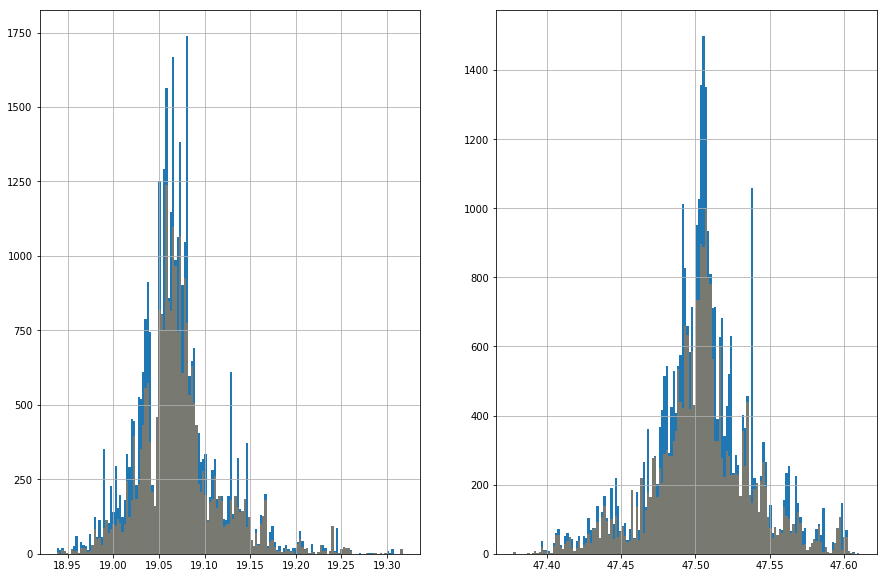

In [57]:
bins=150
fig, axs = plt.subplots(1,2)
fig.set_size_inches(30,20)
train_sale.loc[:, 'lng'].hist(bins=bins, ax=axs[0])
train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'lng'].hist(figsize=(15,10), bins=bins, ax=axs[0], alpha=0.4)
train_sale.loc[:, 'lat'].hist(bins=bins, ax=axs[1])
train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'lat'].hist(figsize=(15,10), bins=bins, ax=axs[1], alpha=0.4)

In [58]:
normaltest(train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'price_per_sqm'])

NormaltestResult(statistic=9735.969478637397, pvalue=0.0)

### Adding extra feature
- Price per squaremeter:
    $\frac{price}{area}$<br><br>

In [39]:
u_raw['price_per_sqm']=u_raw['price_in_huf']/u_raw['area_size']

In [45]:
num_feat=[i for i in listings if (listings[i].dtype!=object) & (i!='id')]

### Eyeballing the heat map

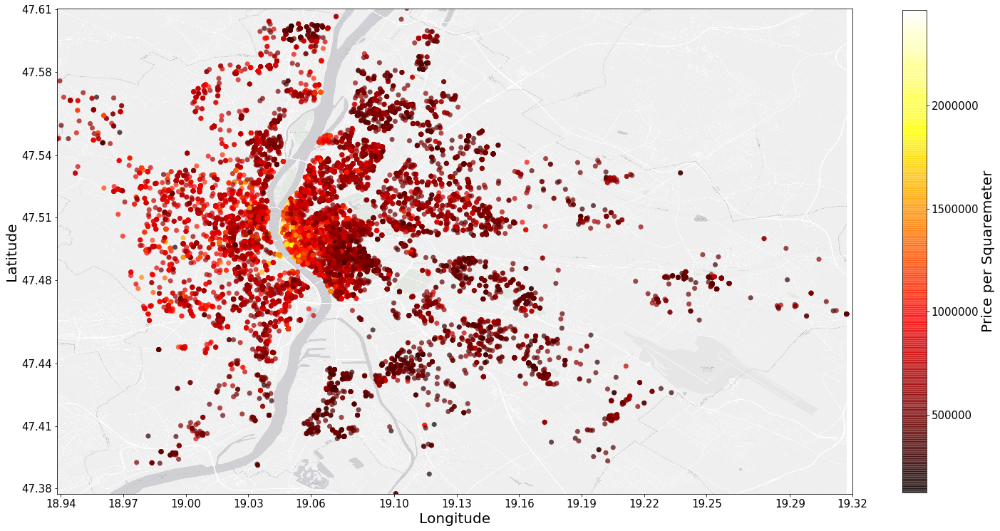

In [70]:
all_mask=(street_num_mask|residental_park_mask|public_domains_mask)&log_price_mask&log_area_mask
plot_scatter_map(x=train_sale.loc[all_mask, 'lng'],
                 y=train_sale.loc[all_mask, 'lat'],
                 c=train_sale.loc[all_mask, 'price_per_sqm'],
                 colormap='hot', c_bar_shrink=0.81,
                 xlabel='Longitude', ylabel='Latitude', clabel='Price per Squaremeter',
                 linewidth=0, s=50, alpha=0.7,
                 figsize=opt_fig_size, dpi=160)
plt.show()

Defining cleaned training dataset:

In [71]:
cl_train_sale=train_sale[all_mask]

Examine relationship between price - area_size

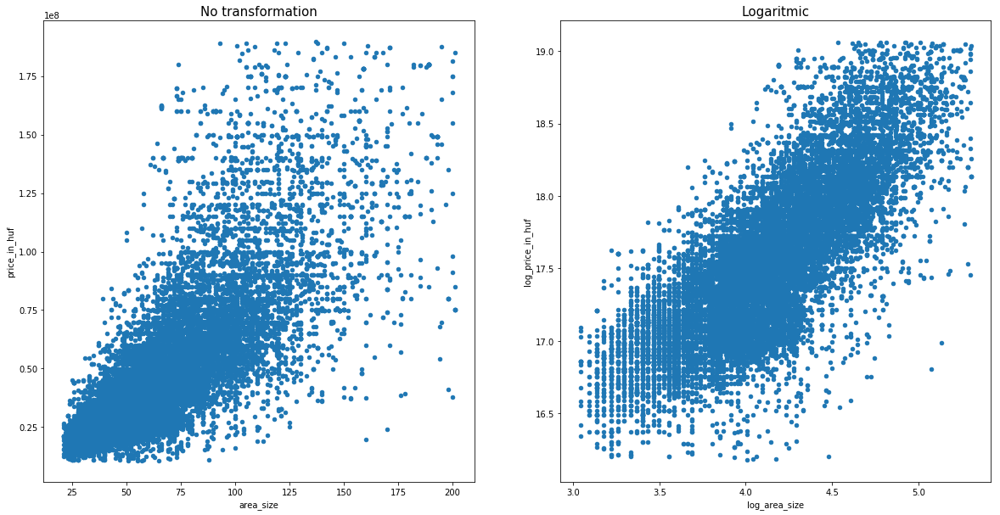

In [72]:
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(20,10)
cl_train_sale.plot.scatter(x='area_size', y='price_in_huf', ax=axs[0])
cl_train_sale.plot.scatter(x='log_area_size', y='log_price_in_huf', ax=axs[1])
axs[0].set_title('No transformation', fontsize=15)
axs[1].set_title('Logaritmic', fontsize=15)
plt.show()

In [73]:
lr_log = linear_model.LinearRegression(fit_intercept=True)
lr = linear_model.LinearRegression(fit_intercept=True)

In [74]:
lr_log.fit(X=cl_train_sale[['log_area_size']], y=cl_train_sale['log_price_in_huf'])
lr.fit(X=cl_train_sale[['area_size']], y=cl_train_sale['price_in_huf'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [75]:
print('Area size - price elasticity is: {0:.2}%'.format(lr_log.coef_[0]))

Area size - price elasticity is: 0.99%


In [76]:
folds_n=100
cv_log=cross_val_score(estimator=lr_log, cv=folds_n, X=cl_train_sale[['log_area_size']], y=cl_train_sale['log_price_in_huf'])
cv=cross_val_score(estimator=lr, cv=folds_n, X=cl_train_sale[['area_size']], y=cl_train_sale['price_in_huf'])
print("Linear model R2 is: {0:%}".format(np.mean(cv)))
print("Log-log model R2 is: {0:%}".format(np.mean(cv_log)))

Linear model R2 is: 55.399259%
Log-log model R2 is: 58.042303%


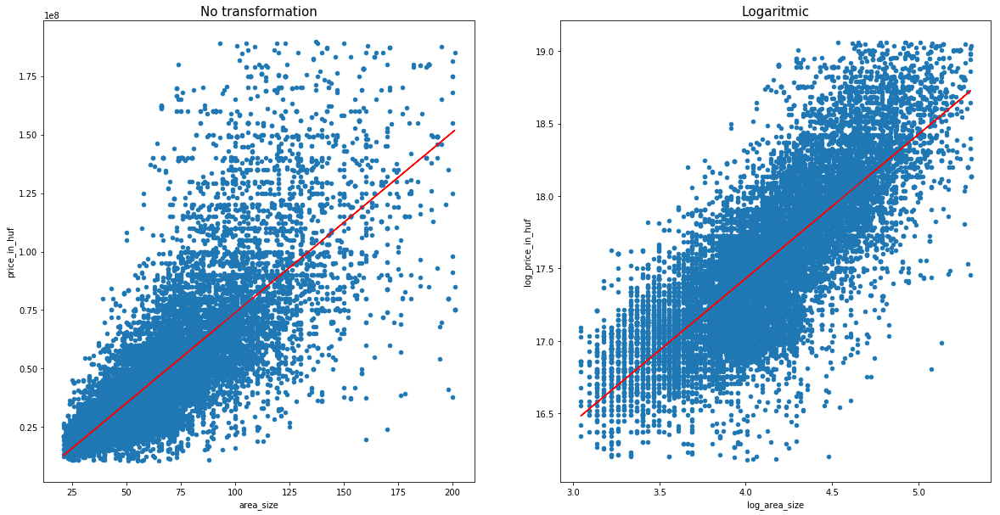

In [77]:
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(20,10)
cl_train_sale.plot.scatter(x='area_size', y='price_in_huf', ax=axs[0])
cl_train_sale.plot.scatter(x='log_area_size', y='log_price_in_huf', ax=axs[1])
axs[0].plot(cl_train_sale.area_size, lr.predict(X=cl_train_sale[['area_size']]), c='r')
axs[1].plot(cl_train_sale.log_area_size, lr_log.predict(X=cl_train_sale[['log_area_size']]), c='r')
axs[0].set_title('No transformation', fontsize=15)
axs[1].set_title('Logaritmic', fontsize=15)
plt.show()

---

### Linear regression:

In [78]:
lin_reg = linear_model.LinearRegression(fit_intercept=True)

In [79]:
lin_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

R$^2$ on training set:

In [80]:
score = lin_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale['price_per_sqm'])
score

0.15415563205769334

Average R$^2$ on cross validated data set with 10 folds:

In [81]:
cross_score = cross_val_score(cv=10, estimator=lin_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.14719619744359697, 0.040771325538198705)

Define boundaries for plotting:

In [82]:
boundaries_file_p = os.path.join(DATA_DIR, 'boundaries.csv')
boundaries_osm_q = os.path.join(SRC_DIR, 'boundaries_osm_query.txt')
boundaries = check_n_query_osm(boundaries_file_p, boundaries_osm_q, add_tag='postal_code')
min_gps=boundaries.min()
max_gps=boundaries.max()

In [83]:
X, Y, Z = create_grid(data_points=200, model=lin_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

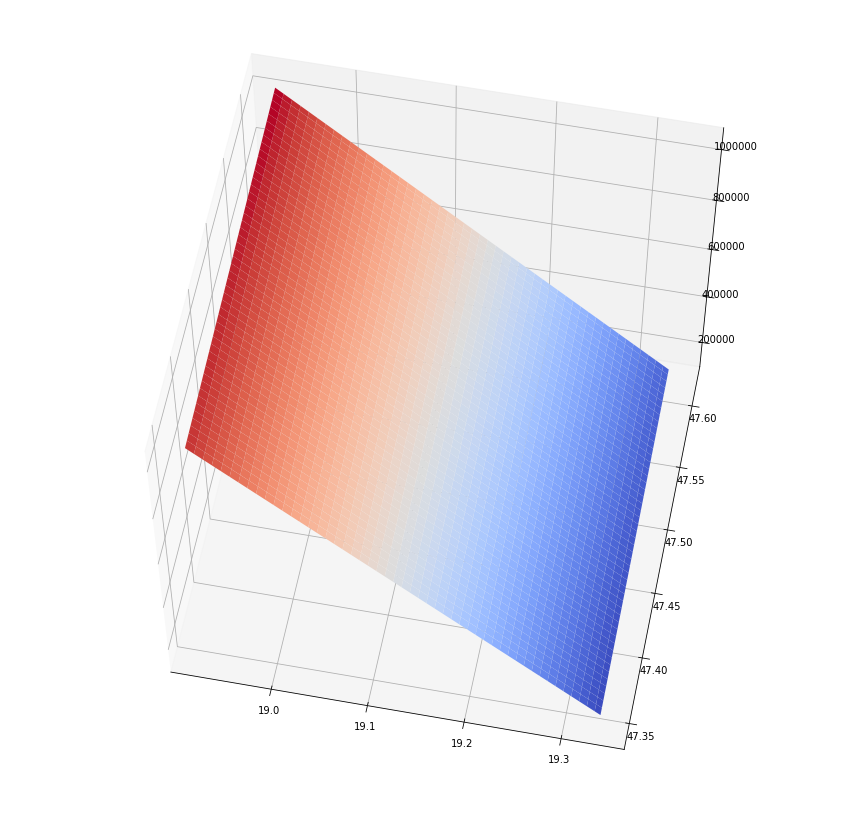

In [84]:
model_name='lin_model_R2_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=True, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Polynomial regression:
#### Hyperparameter:
- Degree of polynomial function

In [82]:
poly_reg = Pipeline([
        ('poly_features', PolynomialFeatures(include_bias=True)),
        ('lin_reg', linear_model.LinearRegression()),
    ])

In [77]:
gs = GridSearchCV(estimator=poly_reg, param_grid={'poly_features__degree':[*range(1, 17)]}, cv=10)

In [78]:
gs.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

GridSearchCV(cv=10, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('poly_features', PolynomialFeatures(degree=1, include_bias=True, interaction_only=False)), ('lin_reg', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False))]),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'poly_features__degree': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [79]:
gs.grid_scores_

[mean: 0.14720, std: 0.04077, params: {'poly_features__degree': 1},
 mean: 0.22686, std: 0.05234, params: {'poly_features__degree': 2},
 mean: 0.24978, std: 0.04415, params: {'poly_features__degree': 3},
 mean: 0.26529, std: 0.04273, params: {'poly_features__degree': 4},
 mean: 0.26846, std: 0.04135, params: {'poly_features__degree': 5},
 mean: 0.27276, std: 0.03817, params: {'poly_features__degree': 6},
 mean: 0.27496, std: 0.03424, params: {'poly_features__degree': 7},
 mean: 0.27277, std: 0.03997, params: {'poly_features__degree': 8},
 mean: 0.27349, std: 0.03993, params: {'poly_features__degree': 9},
 mean: 0.27276, std: 0.04013, params: {'poly_features__degree': 10},
 mean: 0.27265, std: 0.04017, params: {'poly_features__degree': 11},
 mean: 0.27258, std: 0.04008, params: {'poly_features__degree': 12},
 mean: 0.27241, std: 0.03989, params: {'poly_features__degree': 13},
 mean: 0.27267, std: 0.04017, params: {'poly_features__degree': 14},
 mean: 0.27290, std: 0.04020, params: {'pol

In [80]:
gs.best_params_

{'poly_features__degree': 7}

#### The best model:

In [113]:
poly_reg = Pipeline([
        ('poly_features', PolynomialFeatures(degree=7, include_bias=True)),
        ('lin_reg', linear_model.LinearRegression()),
    ])

In [114]:
poly_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('poly_features', PolynomialFeatures(degree=7, include_bias=True, interaction_only=False)), ('lin_reg', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False))])

R$^2$ on training set:

In [115]:
score = poly_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale['price_per_sqm'])
score

0.28009638243806556

Average R$^2$ on cross validated data set with 10 folds:

In [117]:
cross_score = cross_val_score(cv=10, estimator=poly_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale['price_per_sqm'])
cross_score.mean(), cross_score.std() 

(0.27496154817995266, 0.03424338795516304)

In [118]:
X, Y, Z = create_grid(data_points=200, model=poly_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

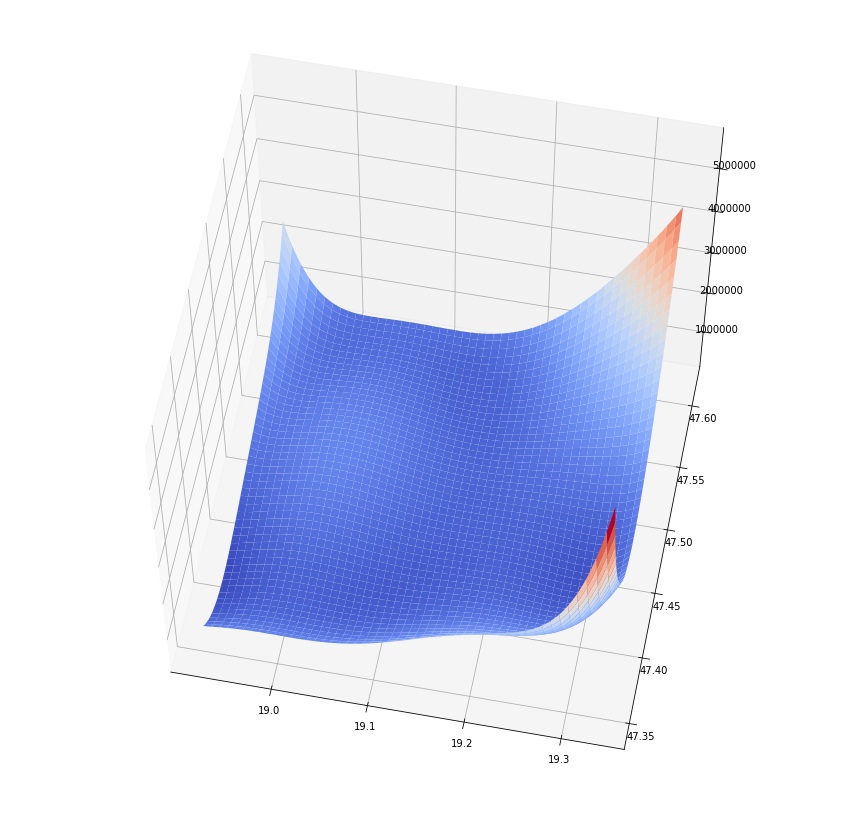

In [119]:
model_name='poly_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=True, dir_name=IMG_DIR, model_name=model_name)
plt.show()

---

### SVM Regression:
#### Hyperparameters:
Kernel: Gaussian Radial Basis function
- *C* as regularization/smoothing parameter
- *Gamma* defines kurtosis of the Gaussian curve

After tuning hyperparameter with GridSearch, I found that model performs the best with *C* = 10000 and *Gamma* paramter has a high impact on the overall performance 

#### Gamma = 1

In [93]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_1.pkl'))

In [94]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=10000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=1,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [95]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.3730155187015747

Average R$^2$ on cross validated data set with 10 folds:

In [96]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.3630701683422495, 0.04335354680483827)

In [98]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

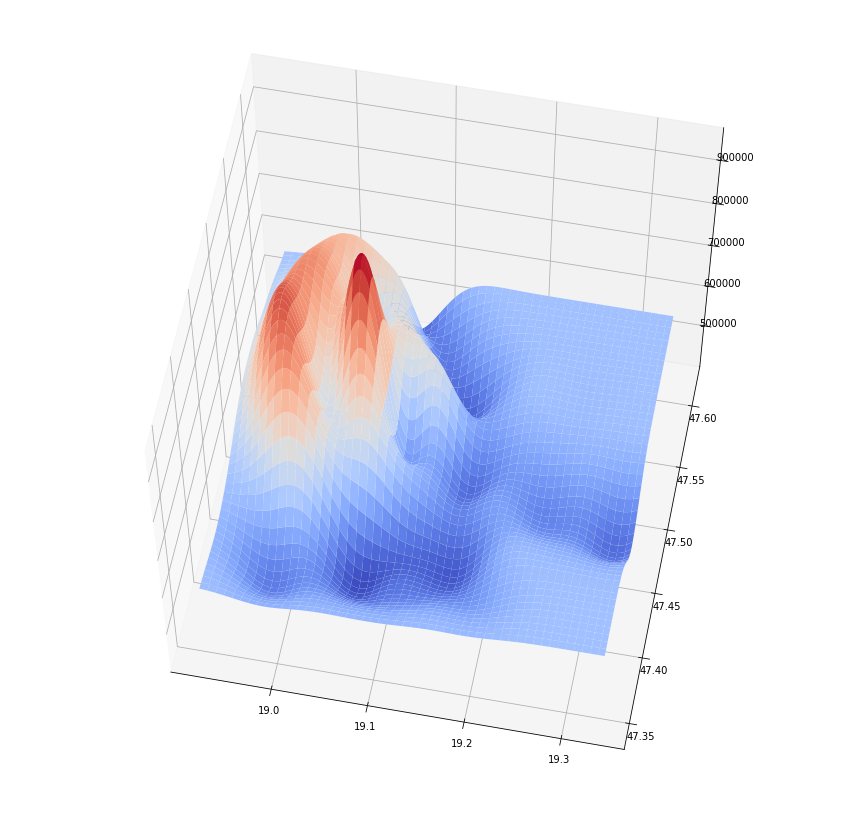

In [99]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

#### Gamma = 6

In [107]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_6.pkl'))

In [108]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=10000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=6,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [109]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.4493681493030904

Average R$^2$ on cross validated data set with 10 folds:

In [110]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.43397747569637624, 0.03824626428234185)

In [111]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

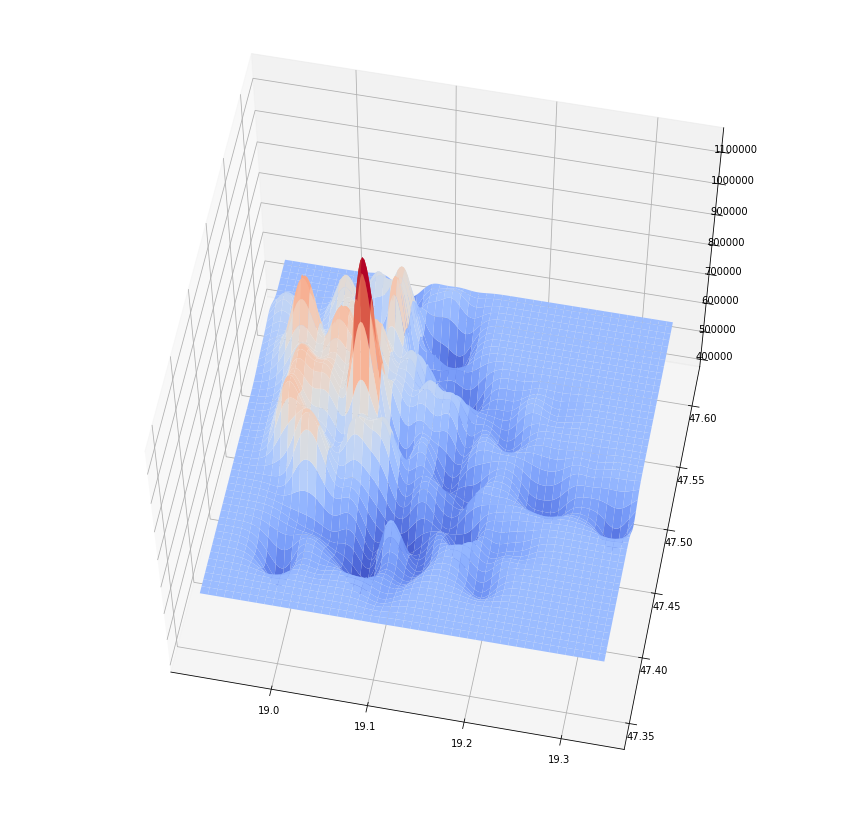

In [112]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

#### Gamma = 12

In [125]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_12.pkl'))

In [114]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=10000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=12,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [115]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.4613702652828109

Average R$^2$ on cross validated data set with 10 folds:

In [116]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.4430404881268283, 0.0370126380627983)

In [117]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

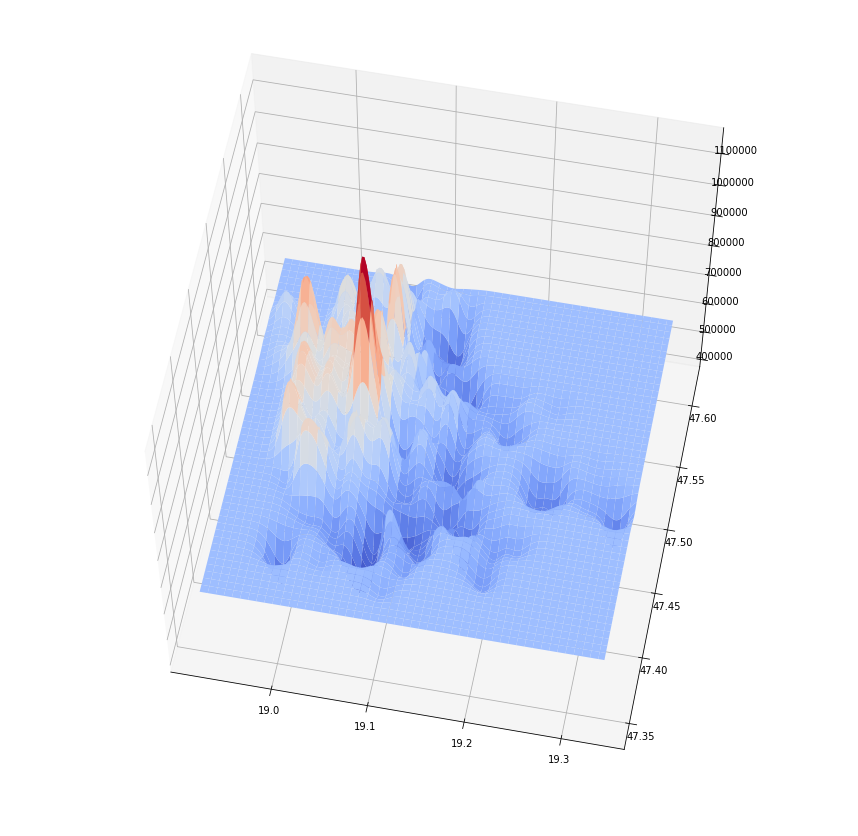

In [118]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

#### Gamma = 200

In [119]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_200.pkl'))

In [120]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=210000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=200,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [121]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.596619927056365

Average R$^2$ on cross validated data set with 10 folds:

In [122]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.5067777323136186, 0.046160124975261)

In [123]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

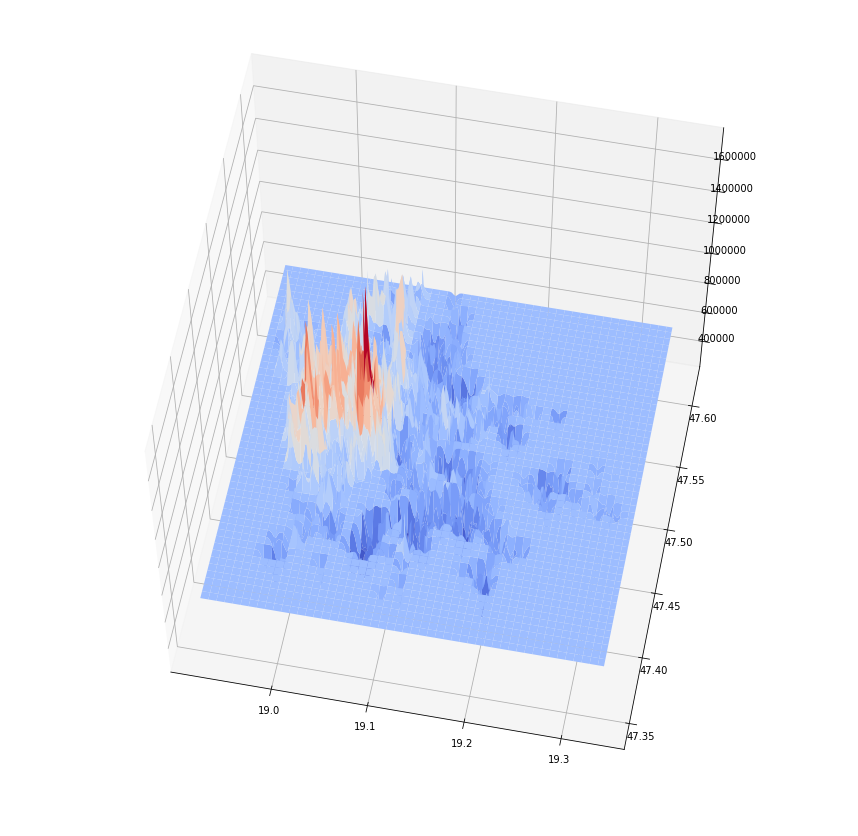

In [124]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Decision Tree Regression:

In [148]:
from sklearn import kernel_approximation

In [150]:
from sklearn.tree import DecisionTreeRegressor

In [151]:
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor

Decision Tree Hyperparameters:
- max_depth
- min_samples_split
- min_samples_leaf (leaf_node: pure node, where gini/entrophy = 0)
- min_weight_fraction
- max_features
- max_leaf_nodes
- min_impurity_decrease
- min_impurity_split

In [184]:
email = Email(sender_email='tibor.szerenyi@gmail.com', receiver_email='tibor.szerenyi@gmail.com')

Type your password and press enter: ········


In [185]:
msg = 'Done'

In [309]:
tree_reg = DecisionTreeRegressor(min_samples_leaf = 10, min_samples_split = 10, max_depth=100)

In [306]:
gs = GridSearchCV(estimator=tree_reg, cv=10, param_grid={'max_depth': [*range(95, 156, 10)]})

In [307]:
gs.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=10,
           min_samples_split=10, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': [95, 105, 115, 125, 135, 145, 155]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [195]:
email.send(msg=msg)

In [308]:
gs.grid_scores_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:761: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


[mean: 0.53707, std: 0.04749, params: {'max_depth': 95},
 mean: 0.53712, std: 0.04758, params: {'max_depth': 105},
 mean: 0.53704, std: 0.04719, params: {'max_depth': 115},
 mean: 0.53696, std: 0.04788, params: {'max_depth': 125},
 mean: 0.53699, std: 0.04721, params: {'max_depth': 135},
 mean: 0.53691, std: 0.04788, params: {'max_depth': 145},
 mean: 0.53683, std: 0.04745, params: {'max_depth': 155}]

In [310]:
tree_reg = DecisionTreeRegressor(min_samples_leaf = 10, min_samples_split = 10, max_depth=100)

In [311]:
tree_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

DecisionTreeRegressor(criterion='mse', max_depth=100, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=10,
           min_samples_split=10, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [312]:
score = tree_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.6443864838385429

In [313]:
cv = cross_val_score(cv=50, estimator=tree_reg, n_jobs=-1, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

In [212]:
tree_reg.feature_importances_

array([0.35704424, 0.64295576])

In [314]:
cv.mean(), cv.std()

(0.541056803633749, 0.07499865071043915)

In [315]:
X, Y, Z = create_grid(data_points=200, model=tree_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

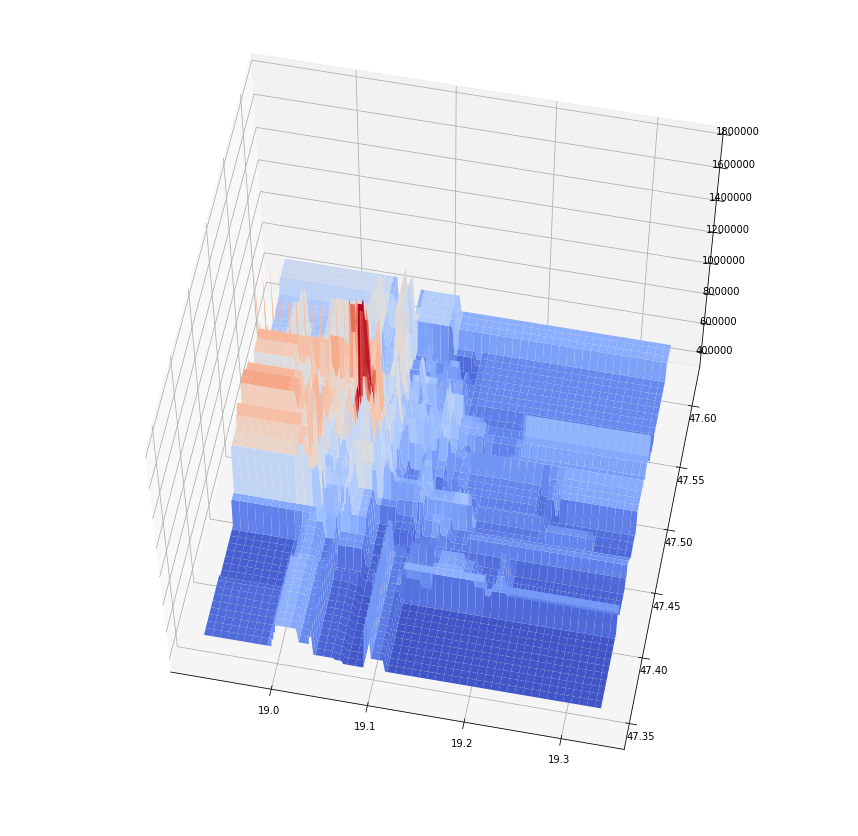

In [316]:
model_name='tree_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Random Forest Regression:

In [317]:
forest_reg = RandomForestRegressor(min_samples_leaf= 10, min_samples_split= 10, max_depth=100, bootstrap=True, oob_score=True, n_estimators=100, n_jobs=-1)

In [318]:
forest_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=100,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=10, min_samples_split=10,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [319]:
score = forest_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.6426981101502919

In [320]:
forest_reg.oob_score_

0.5908704929881766

In [321]:
X, Y, Z = create_grid(data_points=200, model=forest_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

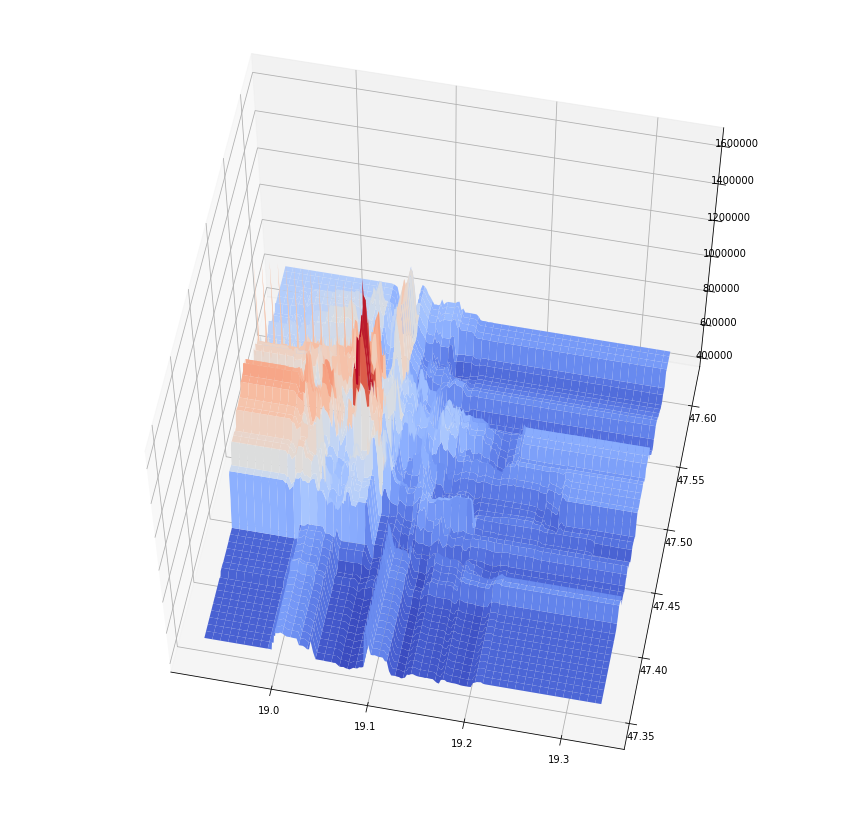

In [322]:
model_name='forest_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Boosting Regression:

In [365]:
tree_reg = DecisionTreeRegressor(max_depth=10)

In [366]:
ada_reg = AdaBoostRegressor(base_estimator=tree_reg, n_estimators=10000)

In [367]:
ada_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best'),
         learning_rate=1.0, loss='linear', n_estimators=10000,
         random_state=None)

In [368]:
score = ada_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.570510375750046

In [369]:
cross_score = cross_val_score(cv=50, estimator=ada_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
print(cross_score.mean(), cross_score.std())
cross_score

0.5055655500127584 0.07963633814534492


array([0.3532032 , 0.43734901, 0.53230041, 0.57402226, 0.54585968,
       0.5003556 , 0.44879914, 0.48093349, 0.54657575, 0.53479494,
       0.50124776, 0.62834759, 0.55379002, 0.58738365, 0.50090976,
       0.56937595, 0.54929287, 0.49544154, 0.55771674, 0.4925342 ,
       0.46065297, 0.48762092, 0.4627915 , 0.39917699, 0.63869082,
       0.59228342, 0.55473692, 0.58512334, 0.54444573, 0.59179015,
       0.58723848, 0.54065734, 0.54747206, 0.54298636, 0.5617945 ,
       0.49690848, 0.5550763 , 0.5984318 , 0.38619054, 0.48212215,
       0.49677763, 0.4493129 , 0.40208389, 0.49712375, 0.3222787 ,
       0.60524227, 0.39859582, 0.4740225 , 0.30559467, 0.32082103])

In [363]:
X, Y, Z = create_grid(data_points=200, model=ada_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

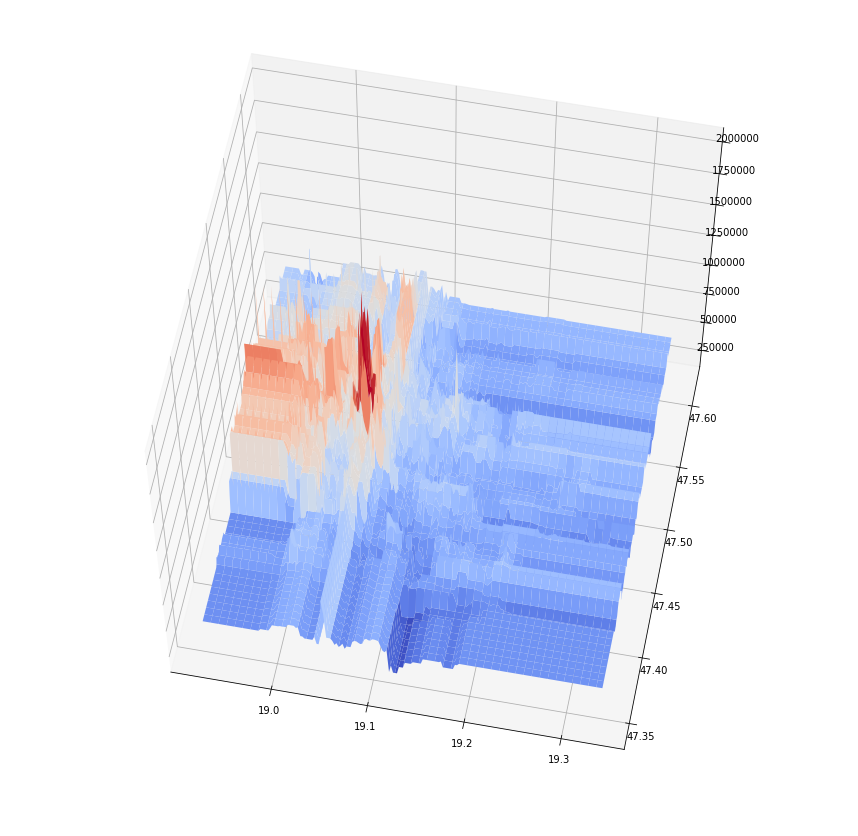

In [364]:
model_name='ada_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### K-Neighbors Regression:

In [204]:
neigh_reg = load_pkl(os.path.join(MODEL_DIR, 'neigh_reg.pkl'))

In [ ]:
neigh_reg = KNeighborsRegressor(weights='distance', p=2, n_jobs=-1, n_neighbors=88)

In [ ]:
gs = GridSearchCV(estimator=neigh_reg, param_grid={'n_neighbors':[64, 80, 84, 88, 92, 96, 112, 128, 256, 512], 'weights':['distance'], 'p':[2]}, n_jobs=-1, cv=50)

In [351]:
gs.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

GridSearchCV(cv=50, error_score='raise',
       estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
          weights='distance'),
       fit_params={}, iid=True, n_jobs=-1,
       param_grid={'n_neighbors': [64, 80, 84, 88, 92, 96, 112, 128, 256, 512], 'weights': ['distance'], 'p': [2]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [352]:
gs.grid_scores_

[mean: 0.56614, std: 0.07968, params: {'n_neighbors': 64, 'p': 2, 'weights': 'distance'},
 mean: 0.56658, std: 0.07938, params: {'n_neighbors': 80, 'p': 2, 'weights': 'distance'},
 mean: 0.56661, std: 0.07940, params: {'n_neighbors': 84, 'p': 2, 'weights': 'distance'},
 mean: 0.56670, std: 0.07925, params: {'n_neighbors': 88, 'p': 2, 'weights': 'distance'},
 mean: 0.56667, std: 0.07934, params: {'n_neighbors': 92, 'p': 2, 'weights': 'distance'},
 mean: 0.56673, std: 0.07944, params: {'n_neighbors': 96, 'p': 2, 'weights': 'distance'},
 mean: 0.56658, std: 0.07962, params: {'n_neighbors': 112, 'p': 2, 'weights': 'distance'},
 mean: 0.56661, std: 0.07954, params: {'n_neighbors': 128, 'p': 2, 'weights': 'distance'},
 mean: 0.56606, std: 0.07940, params: {'n_neighbors': 256, 'p': 2, 'weights': 'distance'},
 mean: 0.56508, std: 0.07997, params: {'n_neighbors': 512, 'p': 2, 'weights': 'distance'}]

In [194]:
neigh_reg = KNeighborsRegressor(weights='distance', p=2, n_jobs=-1, n_neighbors=88)

In [206]:
neigh_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=-1, n_neighbors=88, p=2,
          weights='distance')

In [209]:
cross_score = cross_val_score(cv=10, estimator=neigh_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean()

0.5541891988138374

In [208]:
score = neigh_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.7178516332293401

In [197]:
X, Y, Z = create_grid(data_points=200, model=neigh_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

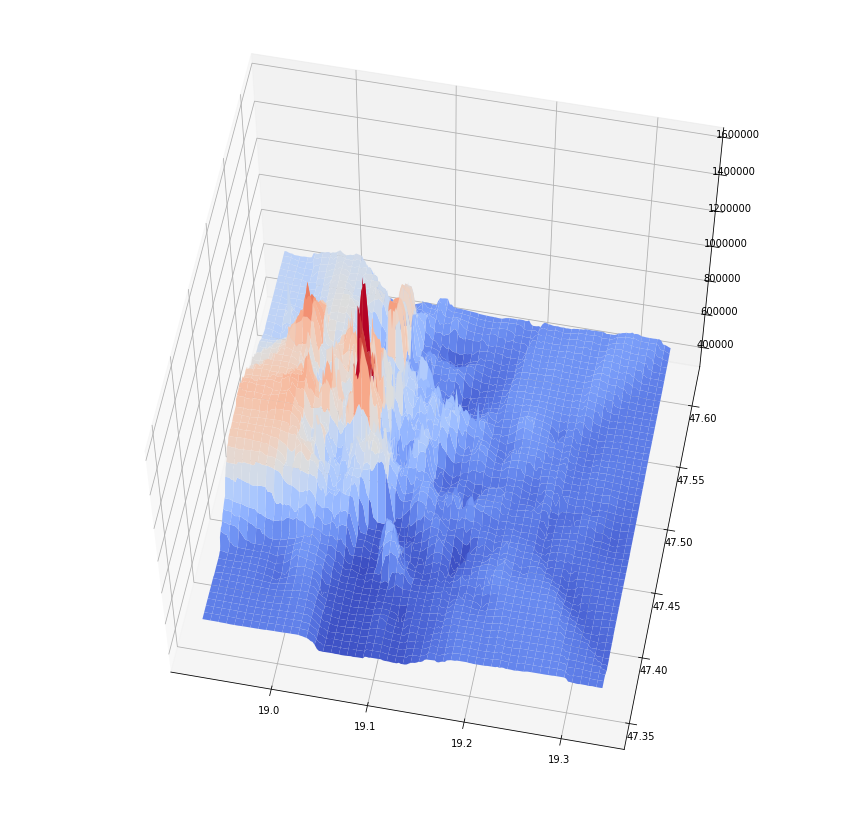

In [198]:
model_name='neigh_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=True, dir_name=IMG_DIR, model_name=model_name)
plt.show()

In [736]:
price_per_sqm = price_per_sqm_reg

In [735]:
price_per_sqm = price_per_sqm_cls * price_per_sqm_reg

In [732]:
perc = 6
price_per_sqm[price_per_sqm==0] = np.mean([np.min(price_per_sqm_reg), np.percentile(price_per_sqm_reg, perc)])

In [727]:
price_per_sqm[price_per_sqm==0] = 0

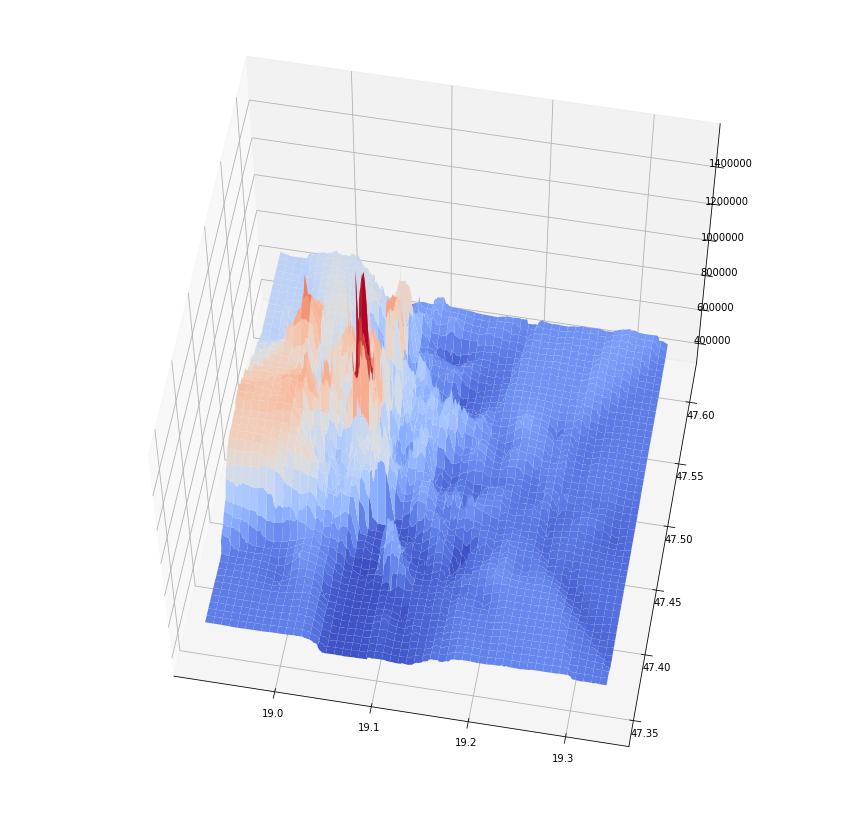

In [737]:
plot_3d_surface(lng, lat, price_per_sqm, rotation=-80, elevation=60, saving=True, dir_name=IMG_DIR, model_name='neighbors')
plt.show()

---

### Classification
- Train a model, which can distinguish between inhabited and uninhabited areas in Budapest
    1. Get the coordinates of the rivers, islands in Budapest, source: OpenStreetMap
    2. Combine new dataset with Real Estate dataset
    3. Split the dataset for training and test set

In [224]:
buda_districts=[1,2,3,11,12,22]
csepel_districts=[21]
pest_districts=[4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 23]

In [241]:
agglomeration_file_p = os.path.join(DATA_DIR, 'agglomeration.csv')
agglomeration_osm_q = os.path.join(SRC_DIR, 'agglomeration_osm_query.txt')
agglomeration = check_n_query_osm(agglomeration_file_p, agglomeration_osm_q, add_tag='name')

In [242]:
agglomeration['inhabited'] = 'inhabited_agglomeration'

In [85]:
uninhabited_file_p = os.path.join(DATA_DIR, 'uninhabited.csv')
uninhabited_osm_q = os.path.join(SRC_DIR, 'uninhabited_osm_query.txt')
uninhabited = check_n_query_osm(uninhabited_file_p, uninhabited_osm_q)

In [244]:
uninhabited['inhabited'] = 'uninhabited'

In [75]:
boundaries_file_p = os.path.join(DATA_DIR, 'boundaries.csv')
boundaries_osm_q = os.path.join(SRC_DIR, 'boundaries_osm_query.txt')
boundaries = check_n_query_osm(boundaries_file_p, boundaries_osm_q, add_tag='postal_code')

In [90]:
boundaries['city_district'] = boundaries['postal_code'].apply(lambda c: int(str(c)[1:-1]))
boundaries['inhabited'] = 'inhabited_budapest'

In [247]:
print(len(boundaries))
print(len(agglomeration))
print(len(uninhabited))

17728
6426
15792


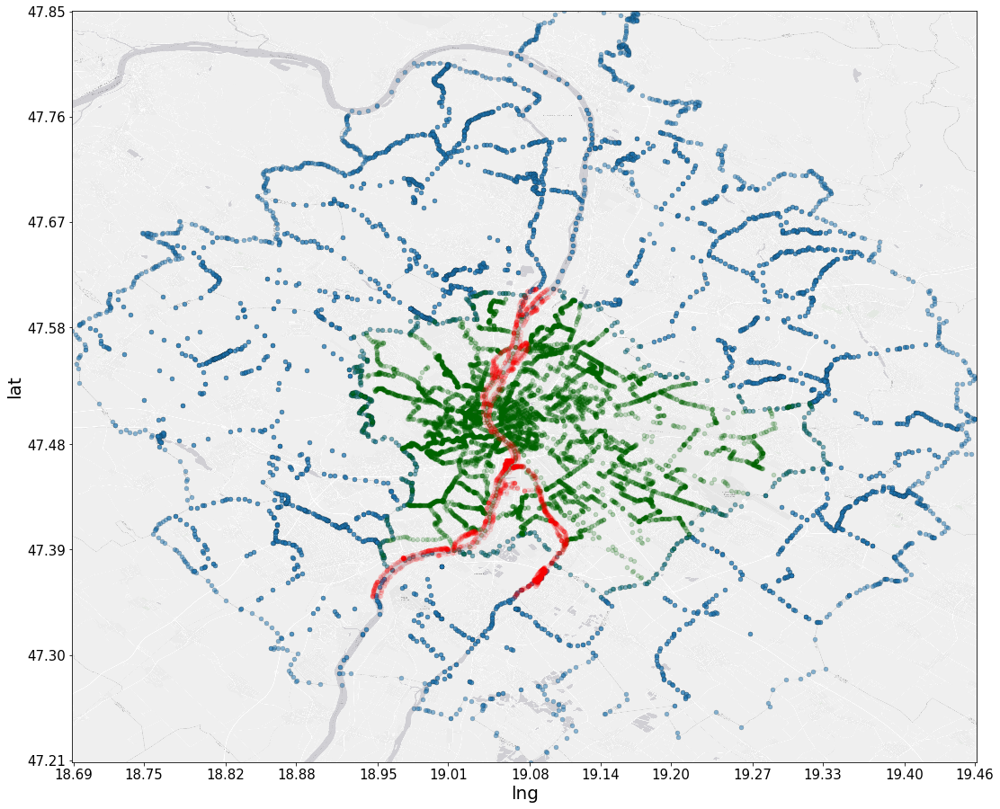

In [146]:
fig, ax = plot_scatter_map(x=agglomeration['lng'], y=agglomeration['lat'], xlabel='Longitude', ylabel='Latitude', figsize=opt_fig_size, dpi=160, alpha=0.5)
boundaries.plot(kind='scatter', x='lng', y='lat', ax=ax, c='darkgreen', alpha=0.1)
uninhabited.plot(kind='scatter', x='lng', y='lat', ax=ax, c='r', alpha=0.1)

Filter out common boundaries among defined areas:

In [256]:
cols=['lat', 'lng', 'inhabited']
boundaries_not_in_uninhabited=~boundaries.lat.isin(uninhabited.lat)&~boundaries.lng.isin(uninhabited.lng)
boundaries_not_in_agglomeration=~boundaries.lat.isin(agglomeration.lat)&~boundaries.lng.isin(agglomeration.lng)
agglomeration_not_in_uninhabited=~agglomeration.lat.isin(uninhabited.lat)&~agglomeration.lng.isin(uninhabited.lng)

In [257]:
listings['inhabited'] = 'inhabited_budapest'

Combined dataset:

In [258]:
budapest = pd.concat([boundaries.loc[boundaries_not_in_uninhabited&boundaries_not_in_agglomeration, cols],
                      agglomeration.loc[agglomeration_not_in_uninhabited, cols],
                      uninhabited.loc[:,cols],
                      listings.loc[:, cols]]).drop_duplicates()

In [261]:
min_gps=boundaries.min()
max_gps=boundaries.max()
bp_min_lng_mask=(min_gps['lng']<=budapest.lng)&(budapest.lng<=max_gps['lng'])
bp_max_lat_mask=(min_gps['lat']<=budapest.lat)&(budapest.lat<=max_gps['lat'])

In [262]:
budapest=budapest[bp_min_lng_mask&bp_max_lat_mask]

In [277]:
budapest['inhabited_factor'] = budapest.inhabited.factorize()[0]

In [278]:
budapest[['inhabited', 'inhabited_factor']].drop_duplicates()

,inhabited,inhabited_factor
0,inhabited_budapest,0
46,inhabited_agglomeration,1
0,uninhabited,2


In [274]:
mpl.cm.Accent.colors[-3:]

((0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
 (0.7490196078431373, 0.3568627450980392, 0.09019607843137253),
 (0.4, 0.4, 0.4))

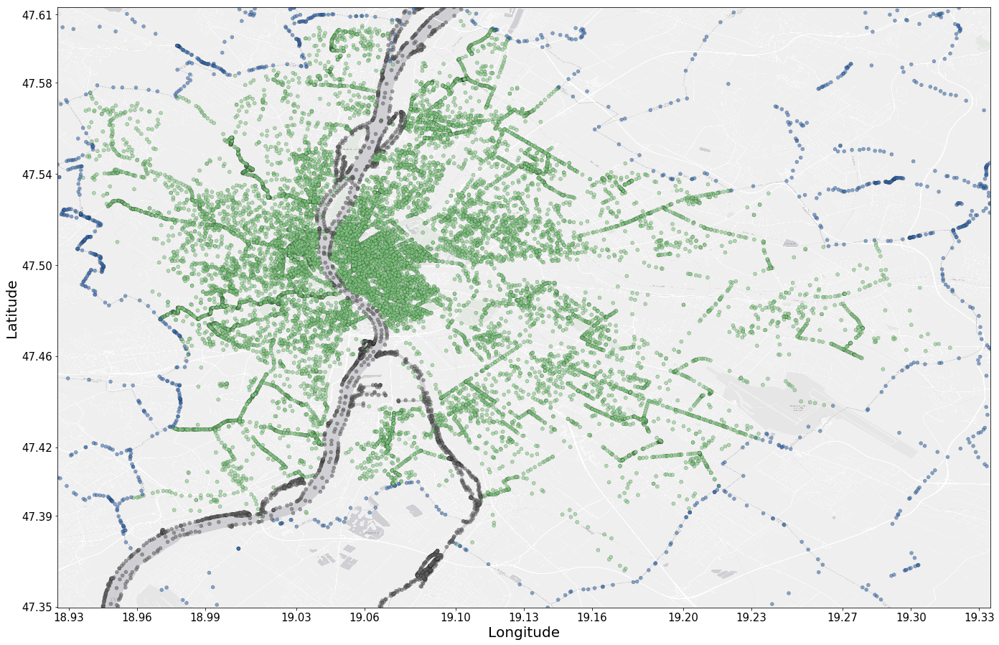

In [279]:
fig, ax = plot_scatter_map(x=budapest['lng'], y=budapest['lat'], c=budapest['inhabited_factor'], colormap='Accent', cbar=False, xlabel='Longitude', ylabel='Latitude', figsize=opt_fig_size, dpi=160, alpha=0.6)

Relative frequency a class:

In [289]:
budapest[['inhabited', 'inhabited_factor']].groupby('inhabited').count()/len(budapest)

,inhabited_factor
inhabited,
inhabited_agglomeration,0.058068
inhabited_budapest,0.831166
uninhabited,0.110766


Split for train and test set:

In [298]:
X_train_bp, X_test_bp, y_train_bp, y_test_bp = train_test_split(budapest[['lat', 'lng']].values,
                                                                budapest.inhabited.values,
                                                                random_state=777,
                                                                test_size=0.2,
                                                                train_size=0.8,
                                                                stratify=budapest.inhabited.values)

In [299]:
len(X_train_bp)/len(budapest), len(X_test_bp)/len(budapest)

(0.8, 0.2)

Stratified sampling:

In [300]:
counter=Counter(y_train_bp)

In [301]:
priori_p = {k:v/len(y_train_bp) for k, v in counter.items()}
priori_p

{'inhabited_agglomeration': 0.05810739668333772,
 'inhabited_budapest': 0.8311397736246381,
 'uninhabited': 0.11075282969202421}

In [ ]:
neigh_cls = KNeighborsClassifier(weights='distance', p=2, n_jobs=-1, n_neighbors=5)

In [ ]:
gs = GridSearchCV(estimator=neigh_cls, param_grid={'n_neighbors':[1,3,5,9,17], 'weights':['distance'], 'p':[2]}, n_jobs=-1, cv=15)

In [ ]:
gs.fit(X=X_train_bp, y=y_train_bp)

In [309]:
gs.grid_scores_

In [309]:
neigh_cls = KNeighborsClassifier(weights='distance', p=2, n_jobs=-1, n_neighbors=5)

In [311]:
neigh_cls.fit(X=X_train_bp, y=y_train_bp)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
           weights='distance')

In [313]:
y_hat = neigh_cls.predict(X=X_test_bp)

In [314]:
post_p = {k:v/len(y_hat) for k, v in Counter(y_hat).items()}
post_p

{'inhabited_agglomeration': 0.056593840484337986,
 'inhabited_budapest': 0.8315346143722032,
 'uninhabited': 0.1118715451434588}

In [319]:
cv = cross_val_score(estimator=neigh_cls, cv=100, X=X_train_bp, y=y_train_bp)

In [320]:
np.mean(cv)

0.9865775197798418

In [199]:
neigh_cls.predict(X=[[47.4902,19.0472]])

array(['uninhabited'], dtype=object)

---

In [ ]:
import seaborn as sns

In [ ]:
sns.distplot()

In [ ]:
data=train_sale.loc[(train_sale.lng==top_10.iloc[0].name[0])&(train_sale.lat==top_10.iloc[0].name[1]), ['price_in_huf', 'area_size', 'room_lt_12_sqm', 'room_ge_12_sqm']]
scatter_matrix(data, figsize=(20,20), hist_kwds={'bins':30})
plt.show()

In [ ]:
import mpld3

In [ ]:
import plotly
plotly.offline.init_notebook_mode()

In [ ]:
plt.scatter(x=raw.loc[raw.listing_type=='for-sale' ,'lng'].values,
            y=raw.loc[raw.listing_type=='for-sale' ,'lat'].values, alpha=1, s=25, marker='o', color='b')
# fig=plt.gcf()
# mpld3.display(fig)
pfig = plotly.tools.mpl_to_plotly(plt.gcf())
plotly.offline.iplot(pfig)

In [ ]:
plt.scatter(x=danube.lng.values, y=danube.lat.values)